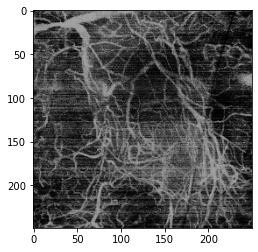

In [2]:
import tifffile
import matplotlib.pyplot as plt
plt.gray()

input_path = 'm63219_res_SIP_420-444_res.tif'

input_img = tifffile.imread(input_path)

plt.imshow(input_img, clim=[0, 400])
plt.show()

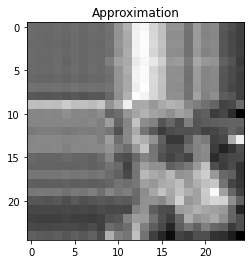

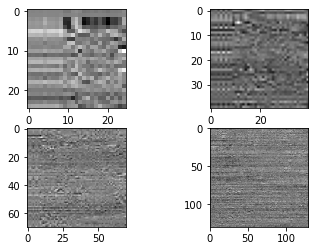

In [3]:
import pywt
import numpy as np

wavelet = 'db6'

coeffs = pywt.wavedec2(input_img, wavelet)
approx = coeffs[0]
detail = coeffs[1:]

nb_levels = len(detail)

plt.title('Approximation')
plt.imshow(approx)
plt.show()

for i, (ch, cv, cd) in enumerate(detail):
    plt.subplot(2, int(np.ceil(nb_levels/2)), i+1)
    plt.imshow(ch)
plt.show()

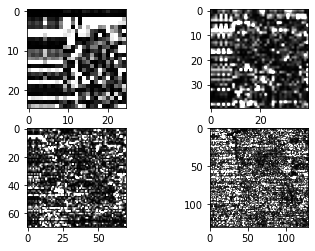

In [4]:
for i, (ch, cv, cd) in enumerate(detail):
    plt.subplot(2, int(np.ceil(nb_levels/2)), i+1)
    ch_sq = ch**2
    plt.imshow(ch_sq, clim=[0, ch_sq.max()/10])
plt.show()

max energy on level 4: 33565400.10613763
max energy on level 3: 27655628.330546606
max energy on level 2: 22624628.18814725
max energy on level 1: 23225622.202200357


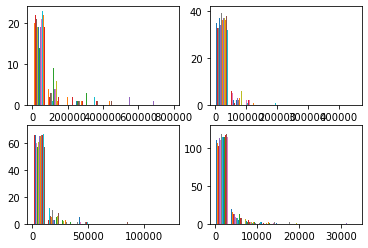

In [5]:
for i, (ch, cv, cd) in enumerate(detail):
    plt.subplot(2, int(np.ceil(nb_levels/2)), i+1)
    ch_sq = ch**2
    plt.hist(ch_sq[:])
    print(f'max energy on level {nb_levels-i}: {ch_sq.sum()}')
plt.show()

In [6]:
from scipy import fftpack
from pystripe import gaussian_filter

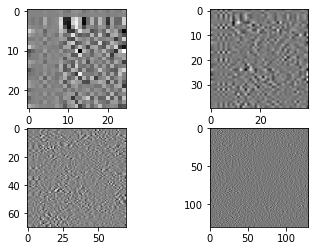

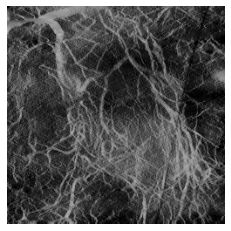

In [7]:
sigma = 64  # pixels

width_fraction = sigma / input_img.shape[0]

coeff_filtered = [approx]
for i, (ch, cv, cd) in enumerate(detail):
    ch_fft = fftpack.rfft(ch, axis=-1)
    
    s = ch.shape[0] * width_fraction
    g = gaussian_filter(shape=ch_fft.shape, sigma=s)
    
    ch_filtered = fftpack.irfft(ch_fft * g)
    
    plt.subplot(2, int(np.ceil(nb_levels/2)), i+1)
    plt.imshow(ch_filtered)
    
    coeff_filtered.append((ch_filtered, cv, cd))

plt.show()
    
img_filtered = pywt.waverec2(coeff_filtered, wavelet)
plt.imshow(img_filtered, clim=[0, 400])
plt.axis('off')
plt.savefig('m63219_res_SIP_420-444_res_output.tif', bbox_inches='tight',pad_inches = 0)
plt.show()

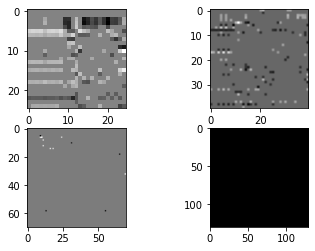

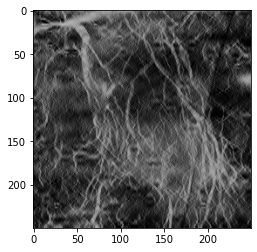

In [8]:
from skimage import filters

threshold = 50000

coeff_filtered = [approx]
for i, (ch, cv, cd) in enumerate(detail):
    mask = ch**2 > threshold
    ch_filtered = ch * mask
    
    plt.subplot(2, int(np.ceil(nb_levels/2)), i+1)
    plt.imshow(ch_filtered)
    
    coeff_filtered.append((ch_filtered, cv, cd))

plt.show()
    
img_filtered = pywt.waverec2(coeff_filtered, wavelet)

plt.imshow(img_filtered, clim=[0, 400])
plt.show()

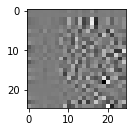

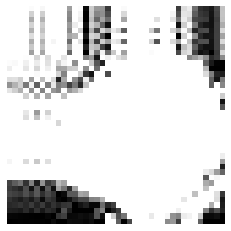

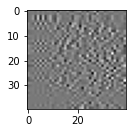

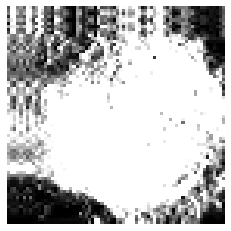

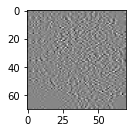

...

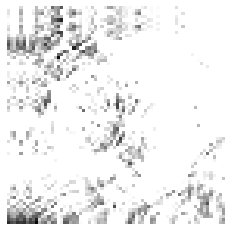

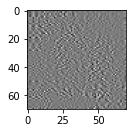

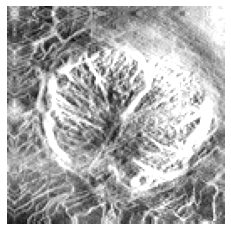

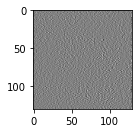

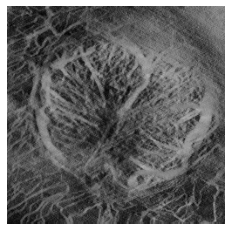

In [10]:
from scipy import ndimage
from scipy import ndimage
import numpy as np
from scipy import fftpack
from pystripe import gaussian_filter
import pywt
import tifffile
import matplotlib.pyplot as plt
from PIL import Image
import os
wavelet = 'db6'
folder_path = 'inpathTIFF/'
output_path = 'imageproccessedoutput/'
for file in os.listdir(folder_path):
    input_path = folder_path + file
    input_img = tifffile.imread(input_path)
    coeffs = pywt.wavedec2(input_img, wavelet)
    approx = coeffs[0]
    detail = coeffs[1:]
    nb_levels = len(detail)
    sigma = 64  # pixels

    width_fraction = sigma / input_img.shape[0]

    coeff_filtered = [approx]
    for i, (ch, cv, cd) in enumerate(detail):
        ch_fft = fftpack.rfft(ch, axis=-1)
        s = ch.shape[0] * width_fraction
        g = gaussian_filter(shape=ch_fft.shape, sigma=s)

        ch_filtered = fftpack.irfft(ch_fft * g)

        plt.subplot(2, int(np.ceil(nb_levels / 2)), i + 1)
        plt.imshow(ch_filtered)

        coeff_filtered.append((ch_filtered, cv, cd))
        img_filtered = pywt.waverec2(coeff_filtered, wavelet)
        plt.show()
        plt.imshow(img_filtered, clim=[0, 400])
        plt.axis('off')
        plt.savefig(output_path + file, bbox_inches='tight', pad_inches=0)
        plt.show()

In [14]:
from PIL import Image
from PIL import ImageFilter
import os


def main():
    # path of the folder containing the raw images
    inPath = "E:\\Programming\\Python\\Stripes removal\\inpathTIFF"

    # path of the folder that will contain the modified image
    outPath = "E:\\Programming\\Python\\Stripes removal\\resized_Images"

    for imagePath in os.listdir(inPath):
        # imagePath contains name of the image
        inputPath = os.path.join(inPath, imagePath)

        # inputPath contains the full directory name
        img = Image.open(inputPath)

        fullOutPath = os.path.join(outPath, 'resized_' + imagePath)
        # fullOutPath contains the path of the output
        # image that needs to be generated
        img.resize((250, 250)).save(fullOutPath)

        print(fullOutPath)


# Driver Function
if __name__ == '__main__':
    main()

E:\Programming\Python\Stripes removal\resized_Images\resized_66379_res_SIP_400-432_re.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_a59376_res_SIP_495-527_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_a65521_res_SIP_410-442_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_ABT006_res_SIP_400-432_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_ABT007_res_SIP_436-468_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_ABT543_res_SIP_299-331_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_ABT544_res_SIP_443-475_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_ABT548_res_SIP_428-460_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_CON354_res_SIP_490-522_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_CON355_res_SIP_420-452_r.tif
E:\Programming\Python\Stripes removal\resized_Images\resized_CON360_res_SIP_358-390_r.tif
E:\Program

8.75651076269652e-27 1.9261752478839222e-17 1.039538011670221e-15


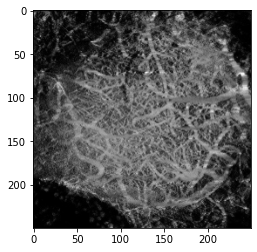

8.75651076269652e-27 4.0608502115785925e-18 1.039538011670221e-15


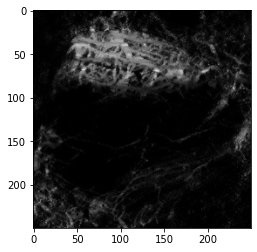

8.75651076269652e-27 1.0532005214147255e-17 1.039538011670221e-15


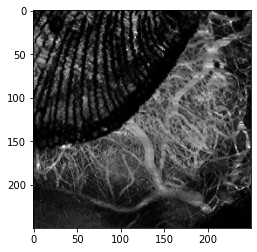

8.75651076269652e-27 1.1755622227853433e-18 1.039538011670221e-15


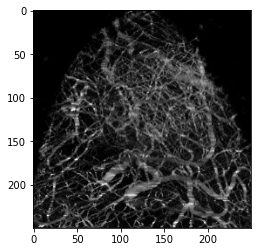

8.75651076269652e-27 1.3740021960294258e-18 1.039538011670221e-15


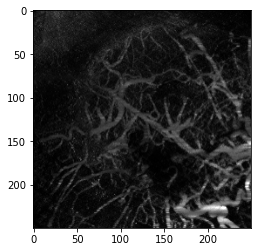

8.75651076269652e-27 1.4644368625473645e-17 1.039538011670221e-15


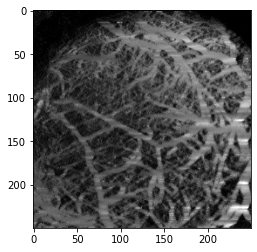

8.75651076269652e-27 3.923832469969429e-18 1.039538011670221e-15


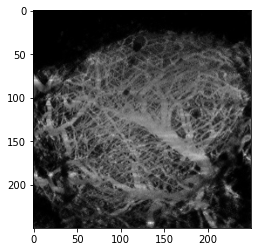

8.75651076269652e-27 8.1486003333158e-19 1.039538011670221e-15


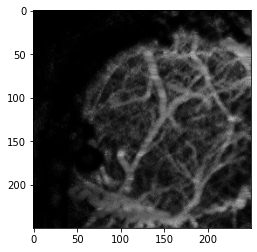

8.75651076269652e-27 2.270762195222807e-19 1.039538011670221e-15


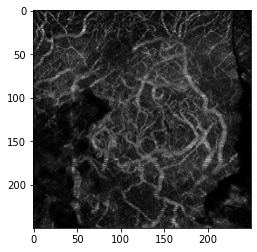

8.75651076269652e-27 6.795373948196855e-19 6.305116760146985e-16


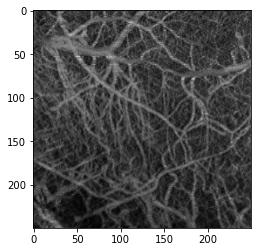

8.75651076269652e-27 2.3058053089712117e-19 3.824246628097134e-16


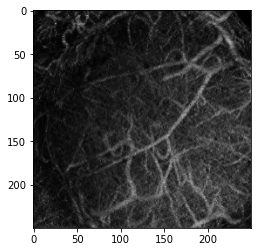

8.75651076269652e-27 1.5217388171744107e-18 1.039538011670221e-15


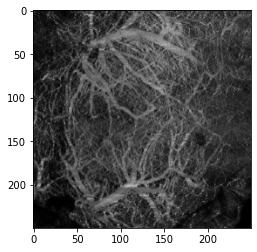

8.75651076269652e-27 2.1164480604516513e-18 9.406128904299166e-16


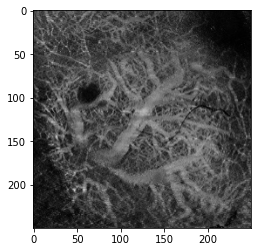

8.75651076269652e-27 3.219575445089519e-17 1.039538011670221e-15


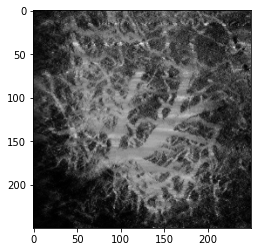

8.75651076269652e-27 2.026183919157563e-19 1.039538011670221e-15


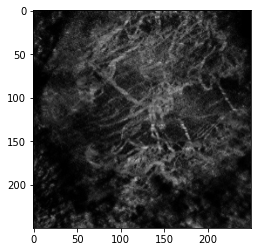

8.75651076269652e-27 4.914129450728333e-18 1.039538011670221e-15


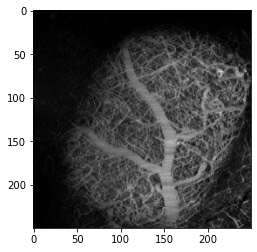

8.75651076269652e-27 6.731258453026995e-19 9.406128904299166e-16


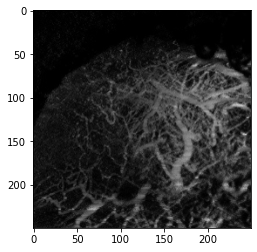

8.75651076269652e-27 5.984738119631353e-18 1.039538011670221e-15


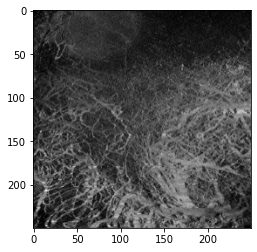

8.75651076269652e-27 6.8632286782756385e-19 9.406128904299166e-16


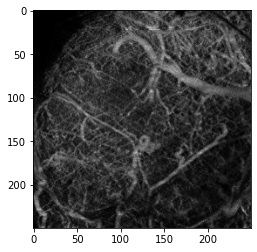

8.75651076269652e-27 5.787724552125144e-18 1.039538011670221e-15


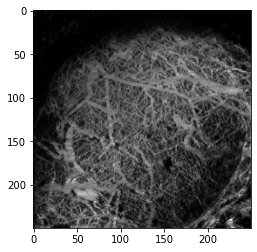

8.75651076269652e-27 8.375978393505212e-18 1.039538011670221e-15


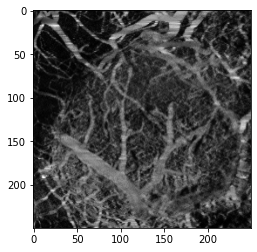

8.75651076269652e-27 2.1819241206980144e-18 1.039538011670221e-15


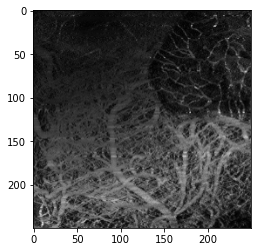

8.75651076269652e-27 3.240347566996194e-18 1.039538011670221e-15


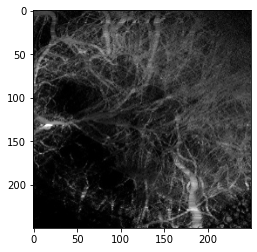

8.75651076269652e-27 2.839894830265978e-17 1.039538011670221e-15


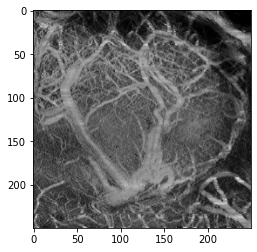

8.75651076269652e-27 7.931585148828916e-19 5.705105569666645e-16


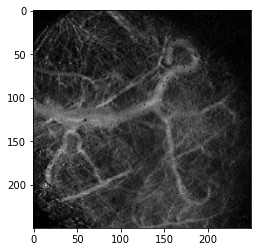

8.75651076269652e-27 1.3193582266133345e-18 7.701087001365463e-16


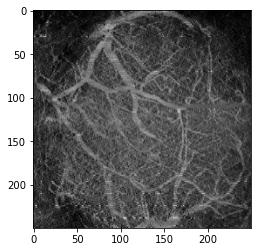

8.75651076269652e-27 1.4749988738799393e-18 1.039538011670221e-15


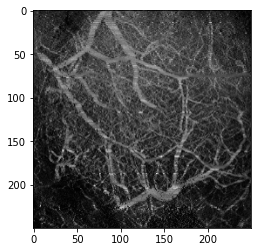

8.75651076269652e-27 7.791580118546907e-20 3.4603214449001304e-16


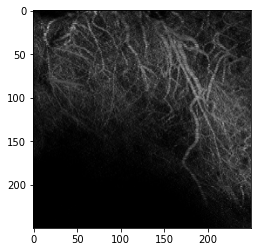

8.75651076269652e-27 9.483059667834919e-20 7.701087001365463e-16


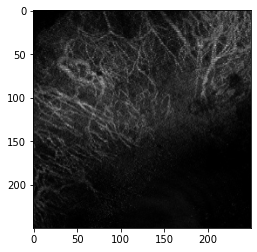

8.75651076269652e-27 3.717864018606671e-19 1.039538011670221e-15


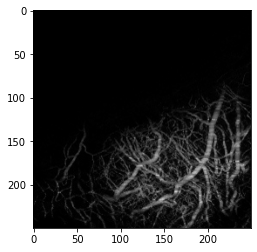

8.75651076269652e-27 2.0428681312146346e-19 1.039538011670221e-15


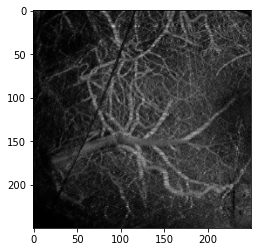

8.75651076269652e-27 7.350159214674503e-19 6.305116760146985e-16


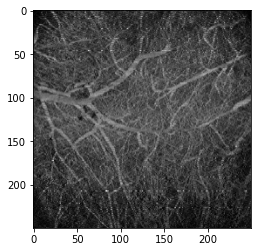

8.75651076269652e-27 1.0006980188556367e-19 5.705105569666645e-16


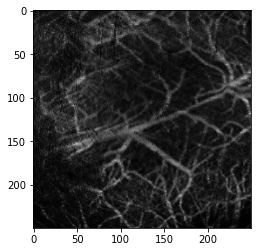

8.75651076269652e-27 3.081897553339228e-17 1.039538011670221e-15


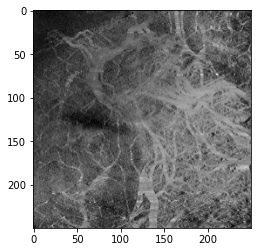

8.75651076269652e-27 2.5740333680052944e-18 1.039538011670221e-15


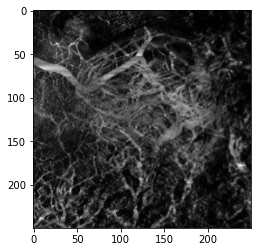

8.75651076269652e-27 2.3078265924173125e-18 1.039538011670221e-15


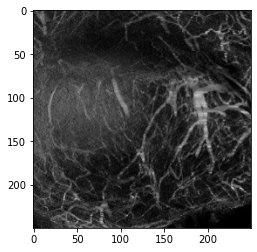

8.75651076269652e-27 1.1732889123408852e-17 1.039538011670221e-15


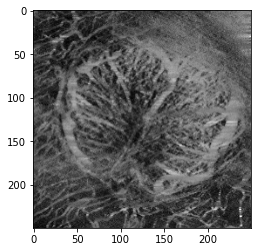

In [16]:
from scipy import ndimage
from scipy import ndimage
import numpy as np
from scipy import fftpack
from pystripe import gaussian_filter
import pywt
import tifffile
import matplotlib.pyplot as plt
from PIL import Image
import os
folder_path = 'resized_images/'
output_path = 'imageproccessedoutputwavelet/'
for file in os.listdir(folder_path):
    input_path = folder_path + file

    # input_path = 'crop.tif'
    wavelet = 'db5'
    sigma_background = 32  # pixels
    sigma_foreground = 64
    threshold = 600
    crossover = 10

    input_img = tifffile.imread(input_path)

    background = np.clip(input_img, None, threshold)
    foreground = np.clip(input_img, threshold, None)

    mask = input_img >= threshold

    # Background filtering
    background_log = np.log(1 + background)
    foreground_log = np.log(1 + foreground)

    background_coeffs = pywt.wavedec2(background_log, wavelet)
    background_approx = background_coeffs[0]
    background_detail = background_coeffs[1:]

    foreground_coeffs = pywt.wavedec2(foreground_log, wavelet)
    foreground_approx = foreground_coeffs[0]
    foreground_detail = foreground_coeffs[1:]

    nb_levels = len(background_detail)
    background_frac = sigma_background / input_img.shape[0]
    foreground_frac = sigma_foreground / input_img.shape[0]

    background_coeff = [background_approx]
    foreground_coeff = [foreground_approx]

    for (bch, bcv, bcd), (fch, fcv, fcd) in zip(background_detail, foreground_detail):
        bch_fft = fftpack.rfft(bch)
        fch_fft = fftpack.rfft(fch)

        bs = bch.shape[0] * background_frac
        fs = fch.shape[0] * foreground_frac

        bg = gaussian_filter(shape=bch_fft.shape, sigma=bs)
        fg = gaussian_filter(shape=fch_fft.shape, sigma=fs)

        bch_filtered = fftpack.irfft(bch_fft * bg)
        fch_filtered = fftpack.irfft(fch_fft * fg)

        background_coeff.append((bch_filtered, bcv, bcd))
        foreground_coeff.append((fch_filtered, fcv, fcd))

    background_log_filtered = pywt.waverec2(background_coeff, wavelet)
    foreground_log_filtered = pywt.waverec2(foreground_coeff, wavelet)

    background_filtered = np.exp(background_log_filtered) - 1
    foreground_filtered = np.exp(foreground_log_filtered) - 1


    def sigmoid(x):
        return 1 / (1 + np.exp(-x))


    def foreground_fraction(img, center, crossover, smoothing):
        z = (img - center) / crossover
        f = sigmoid(z)
        return f  # ndimage.gaussian_filter(f, sigma=smoothing)


    f = foreground_fraction(input_img.astype('float'), threshold, crossover, smoothing=1)

    img_filtered = foreground_filtered * f + background_filtered * (1 - f)

    print(f.min(), f.mean(), f.max())

    plt.imshow(img_filtered, clim=[0, 400])
    plt.savefig(output_path + file, bbox_inches='tight',pad_inches = 0)
    plt.show()